### IMPORT PACKAGES & DATA MINING 

In [13]:
import pandas as pd
from EDA import df1
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.cluster import KMeans
from eda_helper import rows_to_del_with_index
from sklearn import preprocessing
from eda_helper import fill_NaN_between_two_columns

In [14]:
#creating copy of dataframe from EDA notebook for this recommendation notebook
df2=df1 
df2=df2.reset_index() #changing index to int
df2.rename(columns={"simple_description": "merchant"}, inplace=True) #renaming column 'simple_description' to 'merchant'
#df2.info()

#### FUNCTIONS

In [189]:
#Functions:
def merch_name_contains_del(df,contains_dict):
    for k,v in contains_dict.items():
        dfcopy=df.copy()
        mask=(dfcopy.merchant.str.contains(k))
        dfcopy['merchant']=np.where(mask,v,df.merchant)
        df=dfcopy

def merch_name_startswith_del(df,startswith_dict):
    for k,v in startswith_dict.items():
        dfcopy=df.copy()
        mask=(dfcopy.merchant.str.startswith(k))
        dfcopy['merchant']=np.where(mask,v,df.merchant)
        df=dfcopy

        
def elbowMethod(ax,cluster_df,maxNum):
    inertia = []
    K = range(1,maxNum)
    for k in K:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(df_cluster)
        inertia.append(kmeans.inertia_)
    
    plt.plot(K, inertia, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Inertia')
    plt.title('The Elbow Method showing the optimal k')
    
    
def col_transformed(df,col,colname):
    enc=preprocessing.LabelEncoder()
    enc=enc.fit(df[col])
    df[colname]=enc.transform(df[col])
    
def findKmeans(cluster_df, numCluster):
    kmeans=KMeans(n_clusters=numCluster,random_state=45).fit(cluster_df)
    pred_clusters = kmeans.predict(cluster_df)
    pred_centers= kmeans.cluster_centers_
    return pred_clusters,kmeans

def addPredictedClusters(df,clusterCol,columnName):
    dfcopy=df.copy()
    dfcopy[columnName]= clusterCol
    df=dfcopy
    return df

def mapVisualize(df,lat_col,long_col,color_col, title, zoomNum=3, hover_data_cols= ['category','city','merchant', 'latitude', 'longitude']):
   
    fig=px.scatter_mapbox(df, lat=lat_col, lon=long_col, color=color_col,title=title, zoom=zoomNum,
                  hover_data= hover_data_cols, mapbox_style="open-street-map")
    
    fig.show()
    
def numOfClusters(df,clusterCol):
    df_dist=df.groupby(clusterCol)[clusterCol].count().to_frame()
    return df_dist.T

### DATA WRANGLING 

#### 1. Cleaning a few merchant's names that have some obvious words that are not in their actual names

In [16]:
rest_list=[]
for merch in df2.merchant:
    if ((merch[0:8]=='*pending')):
        rest_list.append(merch[30:])
    elif (merch[0:7]=='pending'):
        rest_list.append(merch[23:])
    elif (merch[0:2]=='p '):
        rest_list.append(merch[11:25])
    elif (merch[0:2]=='pp'):
        rest_list.append(merch[3:])
    elif (merch[0:2]=='a '):
        rest_list.append(merch[7:])
    elif (merch[0:8]=='visa pp*'):
        rest_list.append(merch[8:])
    elif (merch[0:7]=='visa sq'):
        rest_list.append(merch[9:])
    elif (merch[0:4]=='visa'):
        rest_list.append(merch[5:26])
    elif (merch[0:2]=='sq'):
        rest_list.append(merch[4:])
    elif (merch[0:2]=='sp'):
        rest_list.append(merch[5:])
    elif(merch[0:7]=='*******'):
        rest_list.append(merch[7:])
    else:
        rest_list.append(merch)
        
#rest_list #visa visa pp* 'sq, visa jefes tacos & tequila 'yonah mountain fridas mexican zucca bar ziggy tandur indi, not just coffe, winot coffee, christ cafe
sorted(rest_list)
df2.reset_index(inplace=True, drop=True)
df2['merchant']=rest_list

#### 2. Creating subset for CO only from df2 as it has the most number of rows in the data

In [17]:
##Focusing on CO only 
df2_co=df2[df2.state=='CO']
df2_co.reset_index(drop=True, inplace=True)#6693 rows
df2_co.info() #6693

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6693 entries, 0 to 6692
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        6693 non-null   datetime64[ns]
 1   uid         6693 non-null   object        
 2   category    6693 non-null   object        
 3   categoryid  6693 non-null   float64       
 4   merchant    6693 non-null   object        
 5   amountnum   6693 non-null   float64       
 6   city        5961 non-null   object        
 7   state       6693 non-null   object        
 8   zip_code    4959 non-null   object        
 9   address     3239 non-null   object        
 10  latitude    3258 non-null   float64       
 11  longitude   3258 non-null   float64       
 12  accountid   6693 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(7)
memory usage: 679.9+ KB


#### 3. Cleaning data as best as possible for CO only

3a: Swapping correct names for some merchants that contain certain strings

In [18]:
dict_contains={
'unique nails':'unique nails',
'chateaux family':'chateaux family & cosmatics',
'hmart-aurora':'hmart-aurora',
'huakee bbq':'huakee bbq',
'hmart-westminster': 'hmart-westminster',
'five & hoek': 'five & hoek',
'basecamp': 'basecamp',
'batteries': 'batteries plus bulbs',
'benny': "benny's tacos",
'vapor distillery':'vapor distillery',
'twisted pine':'twisted pine brewery',
'tundra restauran': 'thundra restaurant',
'walnut cafe': 'walnut cafe',
'attic bar': 'attic bar',
'broadmoor': 'broadmoor',
'sundown saloon': 'sundown saloon',
'tune up': 'tune up',
'rayback': 'rayback collective',
'pho haus':'pho haus',
'pearl st': 'pearl st pub',
'fedex': 'fedex',
'blackjack': 'blackjack pizza',
'colorado plains': 'colorado plains',
"tommy's subs":"tommy's subs",
"thorobred liquors":"thorobred liquors",
'the sing':'the singing cook',
'one way disposal':'one way disposal',}

## Function to excecute above dictionary
merch_name_contains_del(df2_co,dict_contains)

3b: Swapping correct names for some merchants whose names starts with certain strings

In [19]:
dict_startswith={'10th mountain': '10th mountain','12degree': '12degree brewing',\
'aloha trading': 'aloha trading','ziggi':'ziggis coffee','ziggi':"ziggi's coffee",
'apple': 'apple',
'art mart': 'art mart gifts',
'7 hermits': '7 hermits',
'the bardo':'The Bardo Coffee','target':'target',
'smack daddy':'smack daddy',
'monument liquor':'monument liquor',
'king soop':'king soopers',
'alfalfa': "alfalfa's market",
'10th mountai':'10th mountain',
'the perch coffee':'the perch coffee',
"tommy's subs":"tommy's subs",
"thorobred liquors":"thorobred liquors",
'the market':'the market','the boulder book':'the boulder bookstore','the daily bread':'the daily bread',"broken tee":"broken tee",
' pizza co.':'pizza co.',  ' the tea':'the tea',
' urban winery ':'urban winery',
' usa':'usa',
' w hinman md l':'Hinman MD',
'sondermind':'sondermind',
'sweets':'sweets ice cream',
'taj mahal':'taj mahal',
'sweet cow denver':'sweet cow denver',
'sweet cow north boulder':'sweet cow boulder',
'smart cow 5 castle rock co usa':'smart cow',
'smack daddy piz':'smack daddy', 
'shells and sauce denver co 07/09':'shells and sauce',
'sei x6927 fort':'sei fort collins','scrooge maki':'scrooge maki','salon halcyon':'salon halcyon',
'roo jumps':'roo jumps','rio grande':'rio grande','playstation':'playstation',
'pinto chiropractic center':'pinto chiropractic center', 'pikes peak brewing':'pikes peak brewing',
'pica': "pica's mexican", 'ozo coffee':'ozo coffee','otis':"otis craft",
'olde glory':'olde glory','niwot liquor':'niwot liquor','murphy':'murphy usa',
'monument':"monument liquor",'mid vail':'mid vail','mcguckin hardwar':'mcguckin hardware',
'left hand brewing':'left hand brewing', 'jefe':"jefe tacos & tequila",'jax':'jax outdoor',
'jai thai':'jai thai','hacienda denver':'hacienda denver','gunbarrel':"gunbarrel liquor",
'grappa':"grappa fine wines", 'frontier':'frontier airlines', 
'front range brewin': 'front range brewing','european':'european market',
'einstein':"einstein bagels",'down under':'down under wine','dsw':'dsw'}

## Function to excecute above dictionary
merch_name_startswith_del(df2_co,dict_startswith)

3c: Deleting some rows that match these strings as these are are ambiguous and probably were distroyed while making data anonymous

In [20]:
list_to_del=[' ',"european *******et","/ beltran's meat market, l northglenn co date xx 5422",' towing sterling co #xx0595jqs66kvgsj','/ #xx0938 broomfield-util-pmnt xx19 co','/ #xx0752 broomfield-util-pmnt xx19 co','/ #xx0423 broomfield-util-pmnt xx19 co','/ busaba thai restaurant louisville co date xx 5812','/ mc2 ice cream company broomfield co date xx 5499','/ sq *areyto broomfield co date xx 5814','/ sq *kseni mademoise denver co date xx 5499','2020 eyevenue broomfield co 07/23','652 flight terminal denver co xx0249','affirm.com payme affirm.com st-o6d9s4z9x6x5 ******* *******','albert savings d edi pymnts 24685834 ******* *******','alpine wine & spiritvail co xx8116','animal c&c online xx3','axs.com*denver co','b.o.b.s. louisville co card9815']
list_to_del2=['backdoor gri steamboat spr co card0591','bc barber co denver co 07/08','boulder colonic cen niwot co on xx 1194','boulder general |boulder general sto boulder co us|card nbr: 0853','boyd lake state prk hpb loveland co 07/25','bp#8797383lindbergh & co','brewing *******et lon','brewing *******et coffee','brewing *******et','burgerfi denver denver co 07/21','candys dance academy xx05 co','cavegirl coffee longmont co on xx 7618','cdle ui benefits ui payment ppd id: 1840802678','centers for gastroentero fort collins co #xx2300dmks4q3a5x','checkcard 1205 georgia school of xx5220 co xx8394','checkcard 0105 georgia school of xx5220 co xx3387','cicino enterpri louisville co on xx 7618','cicino enterpri louisville co on xx 7618','citi card online des:payment id:xxxxx3990151571 indn:******* ******* co id:citictp web','city of loui louisville co card9815','colorado early fort collins co on xx 7618','columbia 553 thorton co 07/05','crossroads tradi |crossroads trading boulder co us|card nbr: 0853','cumberland far 07/20 purchase','dbt ares thrift stor |ares thrift store boulder co us|card nbr: 0853','dbt kathmandu restau |kathmandu restauran boulder co us|card nbr: 0853']
list_to_del3=['dbt dhha hospital an |dhha hospital and c denver co us|card nbr: 0853 00:00','dbt busey brews |busey brews nederland co us|card nbr: 0853','dbt maplecreek spa s |maplecreek spa scor boulder co us|card nbr: 0853','dbt mcguckin hardwar |mcguckin hardware boulder co us|card nbr: 0853','dbt pp*root llc |pp*root llc niwot co us|card nbr: 0853','dbt sq *glacier ice |sq *glacier ice cre boulder co us|card nbr: 0853','dbt sq *mcdevitt tac |sq *mcdevitt taco s boulder co us|card nbr: 0853','dbt thrivepass |thrivepass xx85 co us|card nbr: 0853','dbt tst* salto |tst* salto nederland co us|card nbr: 0853','dbt tst* verde - bou |tst* verde - boulde boulder co us|card nbr: 0853','dbt vapor distillery |vapor distillery xx6134 co us|card nbr: 0853 10:54','debit -visa card 0641 buff one card ofboulder co','debit card credit 7509345004 vis 0713 rep fitness ecommerce','digit.co savings v9vysua93dedwpz ******* *******','dog daze photo boulder co nt_gzybzv5h xx3556','dollar tr 600 s holly denver co 07/05','doordash*north italia','dpac garage-xx9093 de','e','electronic deposit sm usd 512','exa 0176 forever 2 littleton co','fitr.tv denver co nt_hevhhxla +xx7574','flying b bar ranch llc xx06 co','foxtail pines veterina xx0000 co', 'gosq.com','hall*******','hays *******et of b b','heroku *oct-xx2954 san franciscous','honolulu poke b johnstown co on xx 7618','icp*airborne gymnasti','ikon pass','ikon pass xx8200 co','in *word travel llc xx8940 co','in *wild view veterinary xx6212 co','in *synergy dog training xx2874 co','inc. moneyl visa direct wi079480 07/27','interest charge on purchases','interest payment',"jenny's *******et",'joy of sox breckenridge co on x 0x70($164.95)','keepthechange credit from acct3747 effective 07/20','little bite of pueblo co on xx 0498','louisville family hosp superior co pxx8389 card 9815', "lucky's *******et", 'marczyk fine fo denver co 07/26','marianjoy rehabilitati wheaton il 07/20', 'mimis cafe 133 westminster co 07/05','modern *******et','morgancnty qlty wtr dist xx3054 co #xx9487hns66k33t6','morgancnty qlty wtr dist xx3054 co #xx9487g5s66ett1w','morgancnty qlty wtr dist xx3054 co #xx9487e3s66j4k0f',"morton's organi lafayette co on x 1x28($57.00)",'mr ds ace home center fort morgan co #xx0197h12mb1rbp1','murder by death llc estes park jtmrrpyoiy7 squareup.com/receipts','national car rxx2167denver co r/a# xx7373','nbfs denver 13801 gran thornton co 07/05','ncal kaiser online pay 07/18 purchase','niwot wh niwot co card9815','njh-events xx6551 co ','nst longmont co xx030','omo st vrain *******e','online scheduled transfer to sav 0460 confirmation# 1464778215','online stores','online transfer from ******* b way2save savings xxxxxx9557 ref #ib08jhb6vb on 07/22/20','online transfer from sav ...8976 transaction#: 9982504545','online transfer to chk ...7034 transaction#: 9972015271 07/20','oreganos bistro 1024 fort collins co','payment to waste connections','payment to visa','payment to verizon','payment to speedpay.com','payment to sendgrid','payment to private internet access','payment to one way disposal','payment to morgan county rural water','payment to left hand water district','payment to dish network','payment to comcast','payment to city of longmont co','payment to city of boulder city','payment to chase card ending in 0503 07/20','payment thank you-mobile','payment thank you - web','petco 1437 63514376','pets and pals veterinary lafayette co','pho brothers ii 0000monument co xx02','pies & gri* pmonument co nt_hnclg6k2 +xx2469']
list_to_del4=['stride bank des:p2p id:******* ******* indn:bank of america co id:xxxxx22151 web','pos 018001 usa petro #68218 south el montca ##8443','rack attack denver internxx6900 co','re','recurring authorized name.com, inc xx2374 co sxx4299 card 0093','renee madison loveland co 07/17','red hawk raffle rhes.svvsd.orco','ritas house of pizza dbt crd 1152 07/21/20 07415779 winslow me c#0104','rocket fizz den denver co on xx 0498','rocky mountain whitew','s&s #302 greenwood vi','s&s #534 longmont co ',"s&s #536 boulder co o",'sai eyebrow des boulder co','savings od protection transfer fee','scofield fruits llc loveland co','sfts consulting sftsaurora co xx9285 misc apparel store','shop 2','simply bulk *******et longmont co on x 7x18($7.59)','sinclair i-70 golden co 07/05','southpark *******et f', 'sos registra denver co card9815','ssp*rockymoutnain kung fuxx2839 co', 'st louis restoration co.','st vrain super*******et','state of nj - la uemploymen ppd id: 4216000928','ste*knightscope','stickergiant.com xx00 co xx00','t2 parking w boulder co card9815','t2 parking 1 boulder co card9815','summit tacos longmont co on x 0x70($44.74)','stickergiant.com xx00 co xx00','stride bank des:p2p id:******* ******* indn:bank of america co id:xxxxx22151 web']
list_to_del5=["yeti's grind vail co sxx7553 card 9815",'withdrawal credit/debit card du xx15 stout 2015 stout st denver co date xx 7523 % card 06 #7407',\
'withdrawal / sq *two arrows vail co date xx 5814',"withdrawal / sq *audrey jane's pizza g boulder co date xx 5812",'withdrawal / scrooge maki bento boulder co date xx 5814',\
'withdrawal / pp*canoenterpr englewood co date xx 5999','withdrawal / cke*simple eatery 402 buena vista co date xx 5812',\
'withdrawal / buffs wash2, llc boulder co date xx 7542','withdrawal / buff wash llc boulder co date xx 7542','withdrawal #xx5311 / mountain exchange 1608 miner street idaho springs co',\
'vp*kci communications xx07 co','usa*vend at air servmonument co tdxx misc/specialty retail','usa*vend at air servmonument co tdxx fast food restaurant','usa*snack soda vending allendale',\
 'upstart network upst loans 558560 web id: ach4945590','university of northern c xx2201 co','univ n. co bkst #1249 greeley co']
list_to_del6=['tst* centro mexica boulder co sxx2391 card 4578',
 'tst* cheffin s cheese',
 'tst* foolish boulder co card4578',
 'tst* illegal boulder co card4578',
 'tst* la vita bella ca',
 'tst* laura s fine candie estes park co',
 'tst* motomak boulder co card4578',
 'tst* southside wal boulder co sxx2183 card 4578',
 'tst* the post - longm',
 'tst* west en boulder co card4578','tp* bodbalan evergreen co card0093',
 'tp* bodbalance kymbreannellc co sxx5747 card 0093',
 'tp* bodbalance kymbreannellc co sxx9432 card 0093',
 'tp* bodbalance kymbreannellc co sxx9898 card 0093','tip top savory boulder co on x 8x17($14.40)','the ice cave cider hmonument co f5p3feczlia squareup.com/receipts',\
 'pine cleaners 1x3170huntersvill xx9298 andystroud83@gmail.co', 'nnt cherry creek acxx',
 'nnt longmont arc thxx',
 'nnt the mountain foxx','dbc irrigation supply',
 'dbt boulder rdhs |boulder rdhs boulder co us|card nbr: 0853',
 'dbt crossroads tradi |crossroads trading boulder co us|card nbr: 0853',
 'dbt l2g*co springs t |l2g*co springs tran colorado spri co us|card nbr: 0853','college transcript il 07/17','color street llc 9736893088',
 'cicino enterpri louisville co on xx 0498','/ los #3136 broomfield co date xx 5631',
 '/ prosper foods company denver co date xx 5199','12 point disti lafayette co sxx9567 card 9815',
 '12th avenue ace hardwar denver co 07/09',
 '3 hundred days distimonument co rlqi8tvp1xm squareup.com/receipts','yps*re/maxaspenleafrealty leadville co',
 'zen babe, llc longmont co on xx 1194','town of vail parkingvail co xx24','northside bottl 7878','monument tasting roomonument co vzofjnbxywr squareup.com/receipts',
'monument tasting roomonument co vzofjnbxywr squareup.com/receipts']

#####
lists=[list_to_del,list_to_del2,list_to_del3,list_to_del4,list_to_del5,list_to_del6]
dfcopy=df2_co.copy()
for list in lists:
    for item in list:
        rowstodel=dfcopy[dfcopy.merchant==item].index
        rows_to_del_with_index(dfcopy,rowstodel)
df2_co=dfcopy

3d. There are 9 rows with wrong lat/long w.r.t CO. These coordinates are showing up in Ocean somewhere. 
(Latitude < 30 and Longitude > -85 are not in CO)

In [21]:
df2_co.sort_values(by=['longitude'], ascending=False).head(9) #9 rows have latitude of < 30 and longitude of > -85

,date,uid,category,categoryid,merchant,amountnum,city,state,zip_code,address,latitude,longitude,accountid
198,2020-08-10,UTaljsLsjma9nB3a3BgRtzfTvWK2,Groceries,10.0,the vitamin shoppe,21.74,Northglenn,CO,10954,49 E Route 59,41.09608,-74.010366,10204036.0
829,2020-07-13,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Hobbies,34.0,michaels,41.50,Longmont,CO,80501,205 ken pratt boulevard suite 200,11.10220,-76.045830,10041637.0
3870,2019-12-26,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Hobbies,34.0,michaels,47.48,Longmont,CO,80501,205 ken pratt boulevard suite 200,11.10220,-76.045830,10041637.0
1127,2020-06-29,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,five guys,19.50,Colonial Heights,CO,23834,707 southpark boulevard,37.26226,-77.388650,10041637.0
30,2020-08-17,UTaljsLsjma9nB3a3BgRtzfTvWK2,Hobbies,34.0,,15.16,Thornton,CO,80233,931 east 120th avenue,10.93734,-80.815760,10204036.0
1648,2020-05-27,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,chick-fil-a,8.14,Littleton,CO,25880,31 crossroads mall,37.84648,-81.197220,10092987.0
1170,2020-06-26,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,chick-fil-a,6.77,Littleton,CO,25880,31 crossroads mall,37.84648,-81.197220,10092987.0
1537,2020-06-04,MqWg0x97h9XwjSCFuxTrKok6JPC3,General Merchandise,44.0,target,5.45,Aurora,CO,30326,3535 peachtree road north east,33.85195,-84.359220,10092333.0
1571,2020-06-02,Nz83cnnZytZoKK4VFmuPc0M6HPw2,General Merchandise,44.0,target,111.05,Aurora,CO,30080,2201 cobb parkway south east,33.89747,-84.479850,10072647.0


In [22]:
# DROPPING 9 rows that ave latitude of < 30 and longitude of > -85
rowstodel=df2_co[df2_co.longitude > -85].index #These are showing up in Caribean Ocean. 
rows_to_del_with_index(df2_co, rowstodel)
df2_co.reset_index(inplace=True, drop=True) 

In [23]:
df2_co.reset_index(inplace=True, drop=True)
df2_co.info() #5984 #lat/long = 3143

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5973 entries, 0 to 5972
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        5973 non-null   datetime64[ns]
 1   uid         5973 non-null   object        
 2   category    5973 non-null   object        
 3   categoryid  5973 non-null   float64       
 4   merchant    5973 non-null   object        
 5   amountnum   5973 non-null   float64       
 6   city        5537 non-null   object        
 7   state       5973 non-null   object        
 8   zip_code    4664 non-null   object        
 9   address     3115 non-null   object        
 10  latitude    3134 non-null   float64       
 11  longitude   3134 non-null   float64       
 12  accountid   5973 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(7)
memory usage: 606.8+ KB


3e. 3143 rows have information about lat/long. Filling these using fill_NaN_between_two_columns.

In [24]:
fill_NaN_between_two_columns(df2_co,'city','latitude')

In [25]:
fill_NaN_between_two_columns(df2_co,'city','longitude')

In [26]:
df2_co.info() #5973 total lat/long = 5455

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5973 entries, 0 to 5972
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        5973 non-null   datetime64[ns]
 1   uid         5973 non-null   object        
 2   category    5973 non-null   object        
 3   categoryid  5973 non-null   float64       
 4   merchant    5973 non-null   object        
 5   amountnum   5973 non-null   float64       
 6   city        5537 non-null   object        
 7   state       5973 non-null   object        
 8   zip_code    4664 non-null   object        
 9   address     3115 non-null   object        
 10  latitude    5455 non-null   float64       
 11  longitude   5455 non-null   float64       
 12  accountid   5973 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(7)
memory usage: 606.8+ KB


3f: Dropping not needed columns. 
    1. As state will remain same for df2_co, dropping 'state'. 
    2. 'accountid' and 'uid' are 1:1 match, therefore keeping 'uid' and dropping 'accountid'.
    3. Dropping 'address' as we dont have all addresses available and also this field wont help with clustering as well 

In [29]:
df2_co=df2_co[['date','uid','category','categoryid','merchant','amountnum','city','latitude','longitude']]
df2_co.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5973 entries, 0 to 5972
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        5973 non-null   datetime64[ns]
 1   uid         5973 non-null   object        
 2   category    5973 non-null   object        
 3   categoryid  5973 non-null   float64       
 4   merchant    5973 non-null   object        
 5   amountnum   5973 non-null   float64       
 6   city        5537 non-null   object        
 7   latitude    5455 non-null   float64       
 8   longitude   5455 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 420.1+ KB


3g. There are 82 rows that are missing lat/long, however they have city information. Using dictionary with general coordinates of the city, replacing those missing values in lat and long columns.

In [30]:
#df2_co.groupby('city')['latitude'].first()

###### These are the values used for missing lat/long for the known cities
city: Basalt, latitude:39.3689, longitude:-107.0328
city: breckenridge  39.4803, -106.0667
city: Commerce City, 39.8083, -104.9339
city: Creede, 37.8492, -106.9264
city: Dillion, 39.6303, -106.0434
city: Eaton, 40.5194, -104.7025
city: Fairplay: 39.2247, -106.0020
city: Federal Heights: 39.8599, -105.0161
city: FoxFields: 39.5917, -104.7925
city: Ft Collins: 40.5853, -105.0844
city: Johnstown: 40.3369, -104.9122
city: Yuma: 40.1222, -102.7252
city: Usafa: 38.9984, -104.8618
city: Trinidad: 37.1695, -104.5005
city: South Fork: 37.6700, -106.6398
city: Sheridan: 39.6469, -105.0253
city: Saguache: 38.0875, -106.1420
city: Palmer Lake: 39.1222, -104.9172
city: Maysville: 38.5386, -106.1903
city: Lonetree: 39.5365, -104.8971

In [31]:
city_lat={'Basalt':39.3689, 'Breckenridge':39.4803,'Commerce City':39.8083,
         'Creede':37.8492,'Dillon':39.6303,'Eaton':40.5194,
         'Fairplay': 39.2247,
         'Federal Heights': 39.8599,
         'FoxFields': 39.5917,
          'Foxfield' : 39.5917,
         'Ft Collins': 40.5853,
         'Johnstown': 40.3369,
         'Yuma': 40.1222,
         'Usafa': 38.9984,
         'Trinidad': 37.1695, 
         'South Fork': 37.6700,
         'Sheridan': 39.6469,
         'Saguache': 38.0875,
         'Palmer Lake': 39.1222,
         'Maysville': 38.5386,
         'Lonetree': 39.5365}
dfcopy=df2_co
dfcopy['latitude']=dfcopy['city'].map(city_lat).fillna(dfcopy['latitude'])
df2_co=dfcopy

In [32]:
city_long={'Basalt':-107.0328, 'Breckenridge':-106.0667,'Commerce City':-104.9339,
         'Creede':-106.9264,'Dillon':-106.0434,'Eaton':-104.7025,
         'Fairplay': -106.0020,
         'Federal Heights':-105.0161,
         'FoxFields': -104.7925,
         'Foxfield': -104.7925,
         'Ft Collins':-105.0844,
         'Johnstown': -104.9122,
         'Yuma':-102.7252,
         'Usafa':-104.8618,
         'Trinidad':-104.5005, 
         'South Fork':-106.6398,
         'Sheridan':-105.0253,
         'Saguache':-106.1420,
         'Palmer Lake': -104.9172,
         'Maysville': -106.1903,
         'Lonetree': -104.8971}
dfcopy=df2_co
dfcopy['longitude']=dfcopy['city'].map(city_long).fillna(dfcopy['longitude'])
df2_co=dfcopy

3h. There are two cities(Crossroads, San Antonio) that are not in CO and therefore those rows don't belong in df2_co.
    1.#33 rows of San Antonio in state=CO?? Seems like a mistake.
    2.#3 rows of 'Crossroads' city. No such town as Crossroads in CO

In [45]:
#len(df2_co[df2_co.city=='San Antonio']) #33 rows
len(df2_co[df2_co.city=='Crossroads']) #3 rows

rowstodel=df2_co[df2_co.city=='San Antonio'].index
rows_to_del_with_index(df2_co, rowstodel)

rowstodel=df2_co[df2_co.city=='Crossroads'].index
rows_to_del_with_index(df2_co, rowstodel)

assert (len(df2_co[df2_co.city=='San Antonio'])==0) & (len(df2_co[df2_co.city=='Crossroads'])==0)

3i: 436 rows of no city and no lat/long info exist. Since I am dealing with very small dataset, I will fillna city with Denver and lat/long will be Denver's generic lat/long 

In [46]:
df2_co[df2_co.city.isnull()]
#436 rows of no city and no lat/long info. Since I am dealing with very small dataset, I will fillna city with Denver and lat/long will be Denver's lat/long 

,date,uid,category,categoryid,merchant,amountnum,city,latitude,longitude
6,2020-08-19,kSCSRuyQqWOxp0kPlXwwF0dmhQ02,Groceries,10.0,king soopers,218.26,None,39.70833,-104.93252
34,2020-08-17,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,brick oven pizza,77.72,NaN,NaN,NaN
82,2020-08-14,kSCSRuyQqWOxp0kPlXwwF0dmhQ02,Restaurants/Dining,22.0,which wich superior sandwiches,19.09,None,39.67993,-104.94228
114,2020-08-13,MT8RxbH99SMCBAtllRUdJqIKY8x1,Travel,23.0,best western,94.06,NaN,NaN,NaN
120,2020-08-12,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,kung fu tea,12.43,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5868,2019-09-07,hLV3OJFWVPUZbAAxXRXzQxli6512,Restaurants/Dining,22.0,roo jumps xx0000 co,70.81,NaN,NaN,NaN
5875,2019-09-07,gg95CpaLypcaAzGvF9fGqmF6W2w1,Restaurants/Dining,22.0,roo jumps xx0000 co,70.81,NaN,NaN,NaN
5881,2019-09-07,h4jqWSl4oNPRqHzt9F2c03W6y5p1,Restaurants/Dining,22.0,roo jumps xx0000 co,70.81,NaN,NaN,NaN
5893,2019-09-06,jA8Rm4XLjKNskb7A8Gn80ak5WWJ3,Healthcare/Medical,11.0,pharmaca integrative pharmacy,52.61,NaN,NaN,NaN


In [47]:
#replacing NaN in latitude with 39.7392 of specific rows
#replacing NaN in longitude with-104.9903 of specific rows
#replacing NaN city with 'Denver' of specific rows

mask = (df2_co.latitude.isnull()) & (df2_co.city.isnull())
df2_co.loc[mask, 'city'] = df2_co.loc[mask, 'city'].fillna('Denver')
df2_co.loc[mask, 'latitude'] = df2_co.loc[mask, 'latitude'].fillna(39.7392)
df2_co.loc[mask, 'longitude'] = df2_co.loc[mask, 'longitude'].fillna(-104.9903)

mask=df2_co.city.isnull()
df2_co.loc[mask, 'city'] = df2_co.loc[mask, 'city'].fillna('Denver')

assert df2_co[df2_co.city.isnull()].empty #assert when cond is false

3j: There are 4 rows with Fort Collins named as 'Ft.Collins'. I am going to replace that with 'Fort Collins'
    There are few rows with 'Colorado Springs' named as  'Colorado Spgs.'. Replacing that with 'Colorado Springs'

In [94]:
mask=df2_co.city=='Ft Collins'
df2_co.loc[mask,'city'] = df2_co.loc[mask, 'city'].replace('Ft Collins','Fort Collins')

mask=df2_co.city=='Colorado Spgs.'
df2_co.loc[mask,'city'] = df2_co.loc[mask, 'city'].replace('Colorado Spgs.','Colorado Springs')

In [95]:
df2_co.reset_index(inplace=True, drop=True)

In [96]:
df2_co.info() #5937 rows (non null) - No NaNs in any col 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5937 entries, 0 to 5936
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        5937 non-null   datetime64[ns]
 1   uid         5937 non-null   object        
 2   category    5937 non-null   object        
 3   categoryid  5937 non-null   float64       
 4   merchant    5937 non-null   object        
 5   amountnum   5937 non-null   float64       
 6   city        5937 non-null   object        
 7   latitude    5937 non-null   float64       
 8   longitude   5937 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 417.6+ KB


### DATA VISUALIZATION

##### MAP OF TRANSACTIONS IN CO

In [97]:
fig=px.scatter_mapbox(df2_co, lat="latitude", lon="longitude", color="category", zoom=3,
                  hover_data= ['merchant', 'latitude', 'longitude'], mapbox_style="open-street-map")
fig.show()

### There are three transactions showing up outside of CO. Fixing coordinates for those merchant transactions below

In [102]:
#correct coordinates of 'sally beauty supply' in Fort Collins
mask=df2_co.longitude==-114.04298
df2_co.loc[mask, 'longitude'] = df2_co.loc[mask, 'longitude'].replace(-114.04298,-105.1165541)

In [103]:
#correct coordinates of 'sally beauty supply' in Longmont
mask=df2_co.longitude==-120.12291
df2_co.loc[mask, 'longitude'] = df2_co.loc[mask, 'longitude'].replace(-120.12291,-105.10193)

In [104]:
#correct coordinates of big 5 sporting goods' in Denver
mask=df2_co.longitude==-117.293944
df2_co.loc[mask, 'longitude'] = df2_co.loc[mask, 'longitude'].replace(-117.293944,-104.940683)
df2_co.loc[mask, 'latitude'] = df2_co.loc[mask, 'latitude'].replace(34.10362,39.653013)

In [105]:
fig=px.scatter_mapbox(df2_co, lat="latitude", lon="longitude", color="category", zoom=3,
                  hover_data= ['merchant', 'latitude', 'longitude'], mapbox_style="open-street-map")
fig.show()

#### Focusing further on categories that have large number of transactions (>100)

In [106]:
df2_co.groupby('category')['category'].count().sort_values(ascending=False)

category
Restaurants/Dining          1802
Groceries                   1339
General Merchandise          908
Home Improvement             384
Gasoline/Fuel                290
Clothing/Shoes               244
Healthcare/Medical           170
Entertainment                166
Travel                       111
Personal Care                 97
Hobbies                       61
Automotive Expenses           56
Online Services               54
Pets/Pet Care                 46
Shops                         42
Utilities                     30
Postage and Shipping          30
Office Supplies               23
Child/Dependent Expenses      23
Food and Drink                21
Home Maintenance              11
Gifts                         10
Service                        5
Service Charges/Fees           5
Education                      4
Electronics                    3
Recreation                     1
Advertising                    1
Name: category, dtype: int64

In [107]:
##trying to see if having unbalance data in category is the reason I am not getting good defined cluster. 
## Delete rows that have < 150 entries.Or Keep only

#Restaurants/Dining          1802
#Groceries                   1339
#General Merchandise          908
#Home Improvement             384
#Gasoline/Fuel                290
#Clothing/Shoes               244
#Healthcare/Medical           170
#Entertainment                166

In [109]:
df2_co_topcat=df2_co[(df2_co.category=='Restaurants/Dining')|(df2_co.category=='Groceries')|(df2_co.category=='General Merchandise')|\
                    (df2_co.category=='Home Improvement')|(df2_co.category=='Gasoline/Fuel')|(df2_co.category=='Clothing/Shoes')|\
                     (df2_co.category=='Healthcare/Medical')|(df2_co.category=='Entertainment')]

In [110]:
df2_co_topcat.reset_index(inplace=True, drop=True)
df2_co_topcat.info() #5303 non null rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5303 entries, 0 to 5302
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        5303 non-null   datetime64[ns]
 1   uid         5303 non-null   object        
 2   category    5303 non-null   object        
 3   categoryid  5303 non-null   float64       
 4   merchant    5303 non-null   object        
 5   amountnum   5303 non-null   float64       
 6   city        5303 non-null   object        
 7   latitude    5303 non-null   float64       
 8   longitude   5303 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 373.0+ KB


In [133]:
df2_co_topcat.groupby('city')['city'].count().sort_values(ascending=False)

city
Lafayette     1177
Longmont       796
Thornton       540
Boulder        483
Denver         474
              ... 
Maysville        1
Edgewater        1
Estes Park       1
Fairplay         1
Yuma             1
Name: city, Length: 78, dtype: int64

### Question: Is having more transactions in Lafayette an issue with clustering? 

#######################################################################

### Clustering

## 1. KMEANS
##### df_cluster= df2_co_topcat ['latitude','longitude']

1a: Elbow Method to find if there are any visiable clusters.

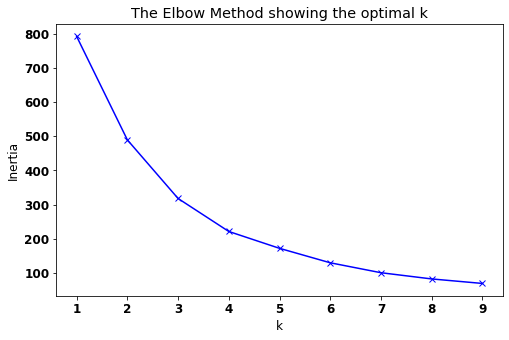

In [118]:
#Kmeans - finding clusters in dataframe with lat and long only
df_cluster=df2_co_topcat[['latitude','longitude']]

#The elbow method to see optimal number of clusters (k)
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
elbowMethod(ax,df_cluster,10)

#fig.savefig('knee-elbow.jpg', bbox_inches = "tight")

#### Perhaps k=3,4,5,6,7 ??

In [140]:
clustersTested=[] #list to be used to drop cluster cols before next experiment

clustername='cluster3'
title="KMeans-lat_lon_TopCat" +"-" + clustername
clusterNum=3
clustersTested.append(clustername)

clusters,kmeans=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster3
cluster3,
0,2618
1,1819
2,866


In [141]:
clustername='cluster4'
title="KMeans-lat_lon_TopCat" +"-" + clustername
clusterNum=4
clustersTested.append(clustername)

clusters,kmeans=findKmeans(df_cluster,clusterNum)


#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)


,cluster4
cluster4,
0,809
1,2414
2,1767
3,313


In [142]:
clustername='cluster5'
title="KMeans-lat_lon_TopCat" +"-" + clustername
clusterNum=5
clustersTested.append(clustername)

clusters,kmeans=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster5
cluster5,
0,2335
1,874
2,809
3,972
4,313


In [143]:
clustername='cluster6'
title="KMeans-lat_lon_TopCat" +"-" + clustername
clusterNum=6
clustersTested.append(clustername)

clusters,kmeans=findKmeans(df_cluster,clusterNum)


#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster6
cluster6,
0,2335
1,834
2,506
3,981
4,313
5,334


In [144]:
clustername='cluster7'
title="KMeans-lat_lon_TopCat" +"-" + clustername
clusterNum=7


clustersTested.append(clustername)
clusters,kmeans=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster7
cluster7,
0,1271
1,834
2,506
3,969
4,312
5,334
6,1077


## Result of KMeans with df_cluster=df2_co_topcat ['latitude,'longitude']
All classes are very unbalanced when using df2_co_topcat and cluster cols = latitude, longitude

## 2. KMEANS
##### df_cluster= df2_co_topcat ['latitude','longitude','city','categoryid']

2a: Delete cluster cols from previous clustering experiment using  list = clustersTested

In [147]:
df2_co_topcat.drop(clustersTested,axis=1, inplace=True)
#df2_co_topcat.head()

,date,uid,category,categoryid,merchant,amountnum,city,latitude,longitude,cityTransformed
0,2020-08-20,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,chick-fil-a,12.22,Littleton,39.568909,-105.110031,48
1,2020-08-20,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,the original pancake house,18.00,Greenwood Village,39.596080,-104.886090,41
2,2020-08-20,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,chick-fil-a,12.21,Longmont,40.152030,-105.096260,51
3,2020-08-20,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,starbucks,9.12,Longmont,40.189100,-105.129870,51
4,2020-08-19,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Groceries,10.0,safeway,42.28,Denver,39.667100,-104.917880,20


2b:Transforming <b>city</b> into integers before using for KMeans

In [136]:
col_transformed(df2_co_topcat,'city','cityTransformed')

2c: Elbow Method to find if there are any visiable clusters.

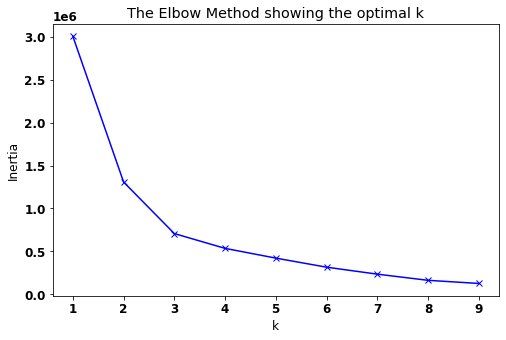

In [150]:
#Kmeans - finding clusters in dataframe with lat,long,cityTransformed,categoryid only
df_cluster=df2_co_topcat[['latitude','longitude','cityTransformed','categoryid']]

#The elbow method to see optimal number of clusters (k)
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
elbowMethod(ax,df_cluster,10)

#fig.savefig('knee-elbow.jpg', bbox_inches = "tight")

#### Perhaps k=3,4,5,6,7

In [171]:
clustersTested=[]
clustername='cluster3'
title="KMeans-lat_lon_city_catid_TopCat" +"-" + clustername
clusterNum=3

clustersTested.append(clustername)

clusters,kmeans3=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster3
cluster3,
0,2618
1,1819
2,866


In [172]:
clustername='cluster4'
title="KMeans-lat_lon_city_catid_TopCat" +"-" + clustername
clusterNum=4

clustersTested.append(clustername)

clusters,kmeans4=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

#df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
#mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster4
cluster4,
0,1767
1,2414
2,809
3,313


In [173]:
clustername='cluster5'
title="KMeans-lat_lon_city_catid_TopCat" +"-" + clustername
clusterNum=5

clustersTested.append(clustername)

clusters,kmeans5=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

#df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
#mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster5
cluster5,
0,2335
1,874
2,809
3,972
4,313


In [174]:
clustername='cluster6'
title="KMeans-lat_lon_city_catid_TopCat" +"-" + clustername
clusterNum=6

clustersTested.append(clustername)

clusters,kmeans6=findKmeans(df_cluster,clusterNum)

#Add new predicted cluster to df
#Visualize clusters on the map
#Find cluster distribution

#df2_co_topcat=addPredictedClusters(df2_co_topcat,clusters,clustername)
#mapVisualize(df2_co_topcat,"latitude","longitude",clustername,title)
numOfClusters(df2_co_topcat,clustername)

,cluster6
cluster6,
0,2335
1,834
2,506
3,981
4,313
5,334


In [ ]:
#cluster3 kinda worked better than others. 

### Results: Cluster3 kind of worked better than others when
#### df_cluster=df2_co_topcat['latitude,'longitude','cityTransformed','categoryid']

### Test: Recommending Engine

In [211]:
def recommend_co_merchants(df,lat,long,cityTransformed,categoryid):
    # Predict the cluster for longitude and latitude provided
    cluster = kmeans3.predict(np.array([lat,long,cityTransformed,categoryid]).reshape(1,-1))[0]
    print(cluster)
   
    # Get the best merchant in this cluster
    return  df[df['cluster3']==cluster].iloc[1:5][['merchant','city','latitude','longitude']]

In [212]:
#recommend_co_merchants(df2_co_topcat, 39.568909,-105.110031,48,22)
recommend_co_merchants(df2_co_topcat,39.667100,-104.917880,20,10)

1


,merchant,city,latitude,longitude
5,king soopers,Denver,39.70833,-104.93252
6,rocket fizz,Fort Collins,40.07206,-105.20091
7,ku cha house of tea,Fort Collins,40.07206,-105.20091
13,panda express,Castle Rock,39.41341,-104.85779


In [208]:
df2_co_topcat.head(10)

,date,uid,category,categoryid,merchant,amountnum,city,latitude,longitude,cityTransformed,cluster3,cluster4,cluster5,cluster6
0,2020-08-20,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,chick-fil-a,12.22,Littleton,39.568909,-105.110031,48,0,1,0,0
1,2020-08-20,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Restaurants/Dining,22.0,the original pancake house,18.00,Greenwood Village,39.596080,-104.886090,41,0,1,0,0
2,2020-08-20,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,chick-fil-a,12.21,Longmont,40.152030,-105.096260,51,0,1,0,0
3,2020-08-20,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,starbucks,9.12,Longmont,40.189100,-105.129870,51,0,1,0,0
4,2020-08-19,A4Kyy9PFU7QLr08iECIlJOMI0zx2,Groceries,10.0,safeway,42.28,Denver,39.667100,-104.917880,20,1,0,3,3
5,2020-08-19,kSCSRuyQqWOxp0kPlXwwF0dmhQ02,Groceries,10.0,king soopers,218.26,Denver,39.708330,-104.932520,20,1,0,3,3
6,2020-08-19,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Groceries,10.0,rocket fizz,8.89,Fort Collins,40.072060,-105.200910,31,1,0,3,3
7,2020-08-19,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Restaurants/Dining,22.0,ku cha house of tea,11.22,Fort Collins,40.072060,-105.200910,31,1,0,3,3
8,2020-08-19,0UIAYEH7qlUI6j1iiIg6XbmJWTG3,Clothing/Shoes,5.0,dsw inc,116.08,Longmont,40.152030,-105.096260,51,0,1,0,0
9,2020-08-19,1fPMZehrbgWogwknDB4ZKluoVFg2,Groceries,10.0,niwot liquor inc niwot co sxx5139 card 9815,21.18,Niwot,40.100818,-105.167939,58,0,1,0,0


In [195]:
np.array([df2_co_topcat.longitude,df2_co_topcat.latitude,df2_co_topcat.cityTransformed,df2_co_topcat.categoryid]).reshape(1,-1)

array([[-105.110031, -104.88609 , -105.09626 , ...,    5.      ,
          44.      ,   44.      ]])